# Example Usage

In [1]:
%matplotlib inline
%config InlineBackend.figure_formats = ['svg']
from IPython.display import display, Markdown
def printmd(object):
    display(Markdown(str(object).replace('\n', '<br>')))
import chalc as ch
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import h5py, logging, sys

# Disable some deprecation warnings from the seaborn plotting library
logging.basicConfig(stream=sys.stdout, level=logging.WARNING)
logging.captureWarnings(True)

For our data we sample 100 points on a circle with some noise and 100 points from inside the unit disk.

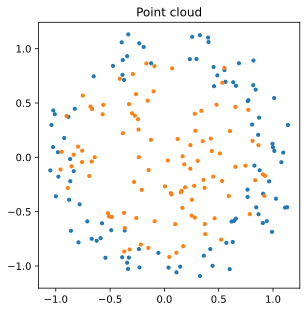

In [2]:
rng = np.random.default_rng(40)
num_points_circle = 100
num_points_disk = 100
mean = [0, 0]
cov = np.eye(2)*0.01
circle = np.array([[np.sin(2*np.pi*t), np.cos(2*np.pi*t)] for t in rng.random(num_points_circle)]).T +\
    rng.multivariate_normal(mean, cov, num_points_circle).T # points as columns
disk = np.sqrt(rng.random(num_points_disk)) * np.array([[np.sin(2*np.pi*t), np.cos(2*np.pi*t)] for t in rng.random(num_points_disk)]).T
points = np.concatenate((circle, disk), axis=1)
plt.scatter(circle[0, :], circle[1, :], s=10)
plt.scatter(disk[0, :], disk[1, :], s=10)
plt.gca().set_aspect('equal')
colours = [0]*num_points_circle + [1]*num_points_disk
plt.title('Point cloud')
plt.show()

We compute the chromatic alpha complex $K$ of the point cloud. $K$ has far fewer simplices than either the Cech or Vietoris-Rips complex, which each have $\displaystyle \binom{200}{2} = 19900$ edges and $\displaystyle \binom{200}{3} = 1313400$ 2-simplices. 

In [3]:
K, _ = ch.chromatic.alpha(points, colours)
printmd(f'$K$ has {len(K.simplices[1])} 1-simplices and {len(K.simplices[2])} 2-simplices')

$K$ has 954 1-simplices and 1312 2-simplices

We can visualise the filtration at any given time. For example, at time 0.3 we have:

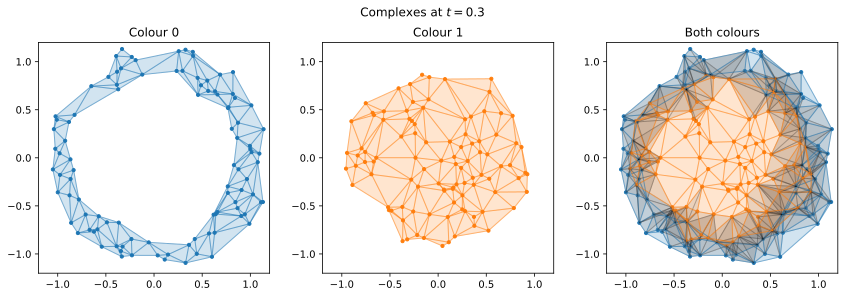

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ch.plotting.draw_filtration(K, points, time=0.3, include_colours=[0], ax=ax[0])
ax[0].set_title('Colour 0')
ch.plotting.draw_filtration(K, points, time=0.3, include_colours=[1], ax=ax[1])
ax[1].set_title('Colour 1')
ch.plotting.draw_filtration(K, points, time=0.3, ax=ax[2])
ax[2].set_title('Both colours')
for i in range(3):
    ax[i].set_xlim(-1.2, 1.2)
    ax[i].set_ylim(-1.2, 1.2)
fig.suptitle('Complexes at $t=0.3$')
plt.tight_layout()
plt.show()

We can compute the 6-pack of persistent homology diagrams of the chromatic alpha complex, the chromatic Delaunay-Cech complex, and the chromatic Delaunay-Rips complex.

In [5]:
# using the previously computed filtration
dgms_alpha = ch.sixpack.from_filtration(K, dom=[0,])
# or directly from the point cloud
dgms_delcech = ch.sixpack.compute(points, colours, dom=[0,], method="chromatic delcech")
dgms_delrips = ch.sixpack.compute(points, colours, dom=[0,], method="chromatic delrips")

Each 6-pack is an object having attributes ``ker``, ``cok``, ``im``, ``dom``, ``cod``, ``rel``, ``entrance_times``, and ``dimensions``. Each of the first 6 of those attributes is an object that has sets of paired and unpaired simplices, while the last two attributes indicate the filtration time and dimension of those simplices. For example-

In [6]:
print(dgms_alpha.ker)

Paired: [(1187, 1200), (1445, 1453), (358, 409), (1995, 1999), (584, 883), (1697, 1701), (228, 235), (333, 581), (361, 456), (454, 471), (1648, 1650), (1486, 1499), (1447, 1495), (1461, 1494), (1565, 1600), (429, 502), (1510, 1514), (606, 626), (1360, 1458), (1248, 1252), (1393, 1403), (1267, 1268), (487, 531), (387, 587), (506, 596), (1454, 1457), (292, 383), (348, 528), (1329, 1331), (421, 491), (252, 438), (1592, 1671), (280, 317), (1464, 1470), (1366, 1408), (359, 412), (2013, 2433), (345, 376), (282, 338), (413, 428), (544, 646), (352, 540), (262, 372), (1692, 1693), (436, 658), (1505, 1516), (331, 416)]
Unpaired: []


A convenience function is provided to extract the diagrams as a matrix of birth/death times:

In [7]:
np.set_printoptions(threshold=10)
print(dgms_alpha.get('ker', 1)) # get the kernel in dimension one
# dgms_alpha.get('ker', [0, 1]) to get the kernel in dimensions zero and one
# dgms_alpha.get('ker') to get the kernel in all dimensions from zero to max(dgms_alpha.dimensions)

[[0.0566658  0.06077279]
 [0.10478006 0.10515716]
 [0.22895679 0.23057114]
 ...
 [0.23772323 0.78357409]
 [0.14216739 0.14226804]
 [0.1135806  0.1155313 ]]


Convenience functions are provided for plotting either a 6-pack or a specific diagram from a 6-pack.

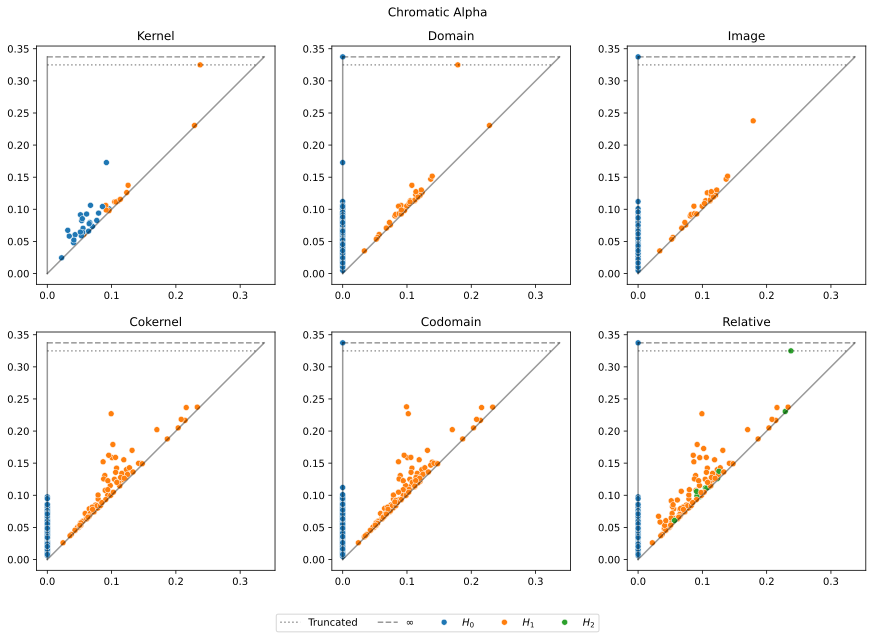

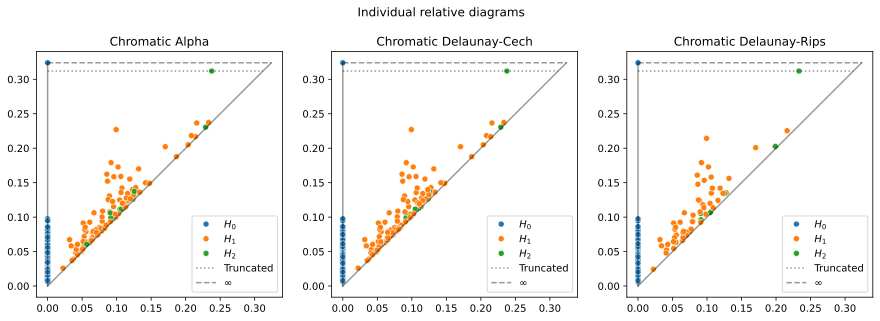

In [8]:
fig1, ax1 = ch.plotting.plot_sixpack(dgms_alpha, tolerance = 1e-3)
fig1.suptitle('Chromatic Alpha')
fig1.set_figwidth(15)
fig1.set_figheight(9)
fig1.subplots_adjust(top=0.92)
plt.show()
print('\n\n')
fig2, ax2 = plt.subplots(1, 3)
ch.plotting.plot_diagram(dgms_alpha, 'rel', truncation = 0.3, ax = ax2[0], tolerance = 1e-3)
ax2[0].set_title('Chromatic Alpha')
ch.plotting.plot_diagram(dgms_delcech, 'rel', truncation = 0.3, ax = ax2[1], tolerance = 1e-3)
ax2[1].set_title('Chromatic Delaunay-Cech')
ch.plotting.plot_diagram(dgms_delrips, 'rel', truncation = 0.3, ax = ax2[2], tolerance = 1e-3)
ax2[2].set_title('Chromatic Delaunay-Rips')
fig2.suptitle('Individual relative diagrams')
fig2.set_figwidth(15)
plt.show()

We can save the diagrams to file or load a diagram from file:

In [9]:
with h5py.File('test.h5', 'w') as f:
    ch.sixpack.save_diagrams(dgms_alpha, f)

with h5py.File('test.h5', 'r') as f:
    dgms_alpha = ch.sixpack.load_diagrams(f)

We can visualise the 2-skeleton of the filtration for points in 2D:

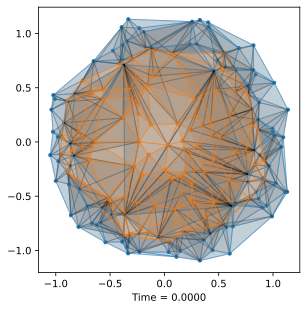

In [10]:
animation = ch.plotting.animate_filtration(
    K, points, filtration_times=list(np.linspace(0, 1.0, 45)), animation_length=5)
animation